# Data analysis using Pandas and Plotly

### Importing all the necessary libraries

In [2]:
#import pandas
import pandas as pd
import numpy as np
import geopandas as gpd
import re

### Importing data from "immo_77k.csv" using Pandas

In [3]:
# Construct the relative path to your CSV file
csv_file_path = '../data/raw/row_immoweb_data0403.csv'

# Read the CSV file and create a DataFrame
df = pd.read_csv(csv_file_path)

# Display the first few rows of the DataFrame
df.head()

,id,region,province,district,locality,postalcode,latitude,longitude,price_main,type,...,condition,facadeCount,hasKitchenSetup,isFurnished,fireplaceExists,hasSwimmingPool,terraceSurface,floodZone,gardenSurface,isNewRealEstateProject
0,10858284,Wallonie,Luxembourg,Arlon,Halanzy,6792,49.582632,5.756293,220000.0,HOUSE,...,TO_RENOVATE,3.0,SEMI_EQUIPPED,False,False,False,42.0,NaN,80.0,False
1,10930768,Flanders,Antwerp,Antwerp,ANTWERPEN,2018,51.194594,4.407379,589500.0,APARTMENT,...,GOOD,4.0,INSTALLED,NaN,False,NaN,28.0,NON_FLOOD_ZONE,NaN,False
2,11137665,Flanders,East Flanders,Gent,ERTVELDE,9940,51.179353,3.740274,825000.0,HOUSE,...,NaN,4.0,SEMI_EQUIPPED,NaN,True,NaN,NaN,NON_FLOOD_ZONE,1635.0,False
3,10966577,Flanders,Antwerp,Antwerp,Kapellen,2950,51.345060,4.401032,575000.0,HOUSE,...,GOOD,4.0,NaN,NaN,False,NaN,NaN,NON_FLOOD_ZONE,NaN,False
4,11110694,Flanders,Antwerp,Antwerp,Deurne,2100,51.234994,4.470870,179000.0,APARTMENT,...,AS_NEW,3.0,SEMI_EQUIPPED,NaN,True,NaN,3.0,NON_FLOOD_ZONE,NaN,False


### Taking out all the symbols in the csv file e.g. €,@,etc

In [4]:
def delete_symbols_and_blank_spaces(text):
    if isinstance(text, str):
         # Remove leading and trailing whitespace
        cleaned_text = text.strip()
        # Remove non-alphanumeric characters except underscore
        cleaned_text = re.sub(r'[^a-zA-Z0-9_\s]', '', cleaned_text)
          
        return cleaned_text
    else:
        return text

### Converting floats in csv file into int

In [5]:
def convert_float_to_int_or_remove_decimal(value):
    if isinstance(value, float):
        # Convert float to int if it's equal to its integer value
        if int(value) == value:
            return int(value)
        else:
            # Remove everything after the decimal point
            return int(value)
    return value

* ### Cleaning up all the data:
    * replacing False and True with 0 and 1
    * drop immoweb id for each house
    * converting floats into int with convert_float_to_int_or_remove_decimal
    * deleting all the symbols using delete_symbols_and_blank_spaces

In [6]:
def clean_up_data(df):
    # Clean up the code
    df.fillna('None', inplace=True)
    df.replace({'False': 0, False: 0, 'True': 1, True: 1}, inplace=True)

    # Checking for duplicates
     # Drop duplicate rows

    df = df.applymap(convert_float_to_int_or_remove_decimal)
    # Apply the function to each element in the DataFrame
    df = df.applymap(delete_symbols_and_blank_spaces)

    return df

#call funciton clean_up_data()
clean_up_data(df)

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\2960502305.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'None' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df.fillna('None', inplace=True)
C:\Users\arian\AppData\Local\Temp\ipykernel_17272\2960502305.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.replace({'False': 0, False: 0, 'True': 1, True: 1}, inplace=True)
C:\Users\arian\AppData\Local\Temp\ipykernel_17272\2960502305.py:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(convert_float_to_int_or_remove_decimal)
C:\Users\arian\AppData\Local\Temp\ipykernel_17272\296

,id,region,province,district,locality,postalcode,latitude,longitude,price_main,type,...,condition,facadeCount,hasKitchenSetup,isFurnished,fireplaceExists,hasSwimmingPool,terraceSurface,floodZone,gardenSurface,isNewRealEstateProject
0,10858284,Wallonie,Luxembourg,Arlon,Halanzy,6792,49,5,220000,HOUSE,...,TO_RENOVATE,3,SEMI_EQUIPPED,0,0,0,42,None,80,0
1,10930768,Flanders,Antwerp,Antwerp,ANTWERPEN,2018,51,4,589500,APARTMENT,...,GOOD,4,INSTALLED,None,0,None,28,NON_FLOOD_ZONE,None,0
2,11137665,Flanders,East Flanders,Gent,ERTVELDE,9940,51,3,825000,HOUSE,...,None,4,SEMI_EQUIPPED,None,1,None,None,NON_FLOOD_ZONE,1635,0
3,10966577,Flanders,Antwerp,Antwerp,Kapellen,2950,51,4,575000,HOUSE,...,GOOD,4,None,None,0,None,None,NON_FLOOD_ZONE,None,0
4,11110694,Flanders,Antwerp,Antwerp,Deurne,2100,51,4,179000,APARTMENT,...,AS_NEW,3,SEMI_EQUIPPED,None,1,None,3,NON_FLOOD_ZONE,None,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78096,11055590,Flanders,West Flanders,Brugge,Brugge,8000,None,None,599000,HOUSE,...,AS_NEW,2,None,0,1,0,None,NON_FLOOD_ZONE,None,0
78097,11024428,Wallonie,Luxembourg,Neufchteau,PALISEUL,6850,49,5,169000,HOUSE,...,GOOD,4,NOT_INSTALLED,None,0,None,None,NON_FLOOD_ZONE,None,0
78098,10601172,Flanders,West Flanders,Roeselare,Roeselare,8800,50,3,245000,HOUSE,...,GOOD,3,INSTALLED,0,0,0,None,NON_FLOOD_ZONE,None,0
78099,11047607,Flanders,Flemish Brabant,Leuven,TieltWinge,3390,50,4,315000,APARTMENT,...,AS_NEW,3,INSTALLED,None,0,None,20,None,None,0


### Writing the clean date into a new file called 'cleaned_immo_77k.csv' and exporting it to the 'clean' folder

In [7]:
def write_to_csv():
    clean_csv_path = '../data/clean/cleaned_row_immoweb_data0403.csv'
    df.to_csv(clean_csv_path, index=False, float_format='%.0f')

    print(f"CSV file exported to: {clean_csv_path}")

write_to_csv()

CSV file exported to: ../data/clean/cleaned_row_immoweb_data0403.csv


### Importing the new, cleaned data into a new df

In [8]:
csv_file_path = '../data/clean/cleaned_row_immoweb_data0403.csv'

# Read the CSV file and create a DataFrame
df = pd.read_csv(csv_file_path)
df = df.rename_axis("id")

df = df.drop('id', axis=1)
df = df.drop_duplicates(subset=['region', 'province','district','locality','postalcode','latitude','longitude','price_main','type','subtype','heatingType','cadastralIncome','epcScores','primaryEnergyConsumption','bedrooms','surface','surfaceGood','hasGasWaterElectricityConnection','condition','facadeCount','hasKitchenSetup','isFurnished','fireplaceExists','hasSwimmingPool','terraceSurface','floodZone','gardenSurface'])

# Display the first few rows of the DataFrame
df.head()
df.shape

(76368, 28)

In [9]:
# # Assuming you want to drop rows where the 'region' column does not have certain values
# regions_to_keep = ["Wallonie", "Flanders", "Brussels"]

# # Filter rows based on the 'region' column
# df = df[df['region'].isin(regions_to_keep)]

# df.shape

regions_to_keep = ["Wallonie", "Flanders", "Brussels"]

# Define latitude and longitude ranges
latitude_range = (48, 51.5)
longitude_range = (2.5, 6.5)

# Filter rows based on region and latitude/longitude ranges
df = df[df['region'].isin(regions_to_keep) & 
                 (df['latitude'].between(*latitude_range)) & 
                 (df['longitude'].between(*longitude_range))]

# Print the shape of the filtered DataFrame
print(df.shape)

(62178, 28)


### How many observations and features do you have?

In [10]:
observations = df.shape[0]
features = df.shape[1]
print(f'There are {observations} observations and {features} feathers in the data set')


There are 62178 observations and 28 feathers in the data set


### What is the proportion of missing values per column for all the proporties?

In [11]:
all_proporties_df = df
missing_data_all = all_proporties_df.isna().sum()
percentage_missing_all = round(missing_data_all * 100 / len(all_proporties_df), 0)
print(f'For all proporties :\n {percentage_missing_all}')

For all proporties :
 region                               0.0
province                             0.0
district                             0.0
locality                             0.0
postalcode                           0.0
latitude                             0.0
longitude                            0.0
price_main                           5.0
type                                 0.0
subtype                              0.0
heatingType                         38.0
cadastralIncome                      0.0
epcScores                           24.0
primaryEnergyConsumption            26.0
bedrooms                             5.0
surface                             17.0
surfaceGood                         43.0
hasGasWaterElectricityConnection    67.0
condition                           33.0
facadeCount                         33.0
hasKitchenSetup                     47.0
isFurnished                         70.0
fireplaceExists                      0.0
hasSwimmingPool                    

### What is the proportion of missing values per column for houses?

In [12]:
house_df = df[df['type'] == "HOUSE"]

missing_data_houses = house_df.isna().sum()
percentage_missing_houses = round(missing_data_houses * 100 / len(house_df), 0)
print(f'For houses :\n {percentage_missing_houses}')

For houses :
 region                               0.0
province                             0.0
district                             0.0
locality                             0.0
postalcode                           0.0
latitude                             0.0
longitude                            0.0
price_main                           0.0
type                                 0.0
subtype                              0.0
heatingType                         33.0
cadastralIncome                      0.0
epcScores                           17.0
primaryEnergyConsumption            20.0
bedrooms                             0.0
surface                             16.0
surfaceGood                          0.0
hasGasWaterElectricityConnection    41.0
condition                           29.0
facadeCount                         20.0
hasKitchenSetup                     46.0
isFurnished                         70.0
fireplaceExists                      0.0
hasSwimmingPool                     69.0
te

### What is the proportion of missing values per column for apartements?

In [13]:
apartment_df = df[df['type'] == "APARTMENT"]

missing_data_apartments = apartment_df.isna().sum()
percentage_missing_apartments = round(missing_data_apartments * 100 / len(apartment_df), 0)
print(f'For apartments :\n {percentage_missing_apartments}')

For apartments :
 region                                0.0
province                              0.0
district                              0.0
locality                              0.0
postalcode                            0.0
latitude                              0.0
longitude                             0.0
price_main                            0.0
type                                  0.0
subtype                               0.0
heatingType                          37.0
cadastralIncome                       0.0
epcScores                            25.0
primaryEnergyConsumption             28.0
bedrooms                              0.0
surface                               9.0
surfaceGood                         100.0
hasGasWaterElectricityConnection    100.0
condition                            31.0
facadeCount                          45.0
hasKitchenSetup                      41.0
isFurnished                          66.0
fireplaceExists                       0.0
hasSwimmingPool 

In [14]:
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt
import nbformat

In [15]:
# Create a Plotly bar plot
fig = go.Figure(data=[
    go.Bar(name='Apartments', x=missing_data_apartments.index, y=percentage_missing_apartments,marker_color='orange'),
    go.Bar(name='Houses', x=missing_data_houses.index, y=percentage_missing_houses,marker_color='blue')
])

# Update the layout
fig.update_layout(title='Percentage of Missing Data for Apartments and Houses',
                  xaxis=dict(title='Features'),
                  yaxis=dict(title='Percentage Missing in %'),
                  barmode='group')

# Show the plot
fig.show()

### Which variables would you delete and why?

I'd get rid of everything that has more than 60% of missing values.
* HOUSES:
    * isFurnished 
    * hasSwimmingPool
    * terrasSurface
    * gardenSurface

* APARTMENTS:
    * isFurnished 
    * hasSwimmingPool
    * gardenSurface
    * surfaceGood

### What variables are most subject to outliers?
price main has the most outliers in apartment_df and house_df
surfaceGoods also have a large amount of outliers in house_df

In [1]:
for column in apartment_df.columns:
    if pd.api.types.is_numeric_dtype(apartment_df[column]):
        Q1 = apartment_df[column].quantile(0.25)
        Q3 = apartment_df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_fence = Q1 - 1.5 * IQR
        upper_fence = Q3 + 1.5 * IQR
        # Filter the dataset to exclude outliers
        filtered_apartment_df = apartment_df[(apartment_df[column] >= lower_fence) & (apartment_df[column] <= upper_fence)]

print(apartment_df.shape)
print(filtered_apartment_df.shape)





NameError: name 'apartment_df' is not defined

In [17]:
import plotly.express as px
from plotly.subplots import make_subplots

# Assuming apartment_df is your DataFrame containing apartment data
apartment_type_df = apartment_df.groupby("subtype")
print(apartment_type_df.head(5))

# Create an empty list to store box plot figures
figs = []

# Iterate over the groups in apartment_type_df
for subtype, data in apartment_type_df:
    # Create a box plot for the current subtype and append it to the list
    figs.append(px.box(data, x='price_main', labels={'price_main': 'Price'}, title=f'Box Plot for {subtype}'))    

# Create a subplot grid with the specified number of rows and columns
rows = len(figs)
cols = 1  # One column for all subtypes
fig = make_subplots(rows=rows, cols=cols, subplot_titles=[f'Subtype: {subtype}' for subtype in apartment_type_df.groups.keys()])

# Add each box plot to the subplot grid
for i, fig_sub in enumerate(figs):
    for trace in fig_sub.data:
        fig.add_trace(trace, row=i + 1, col=1)

# Update layout to set title and adjust spacing
fig.update_layout(title='Box Plot for Prices by Subtype', showlegend=False, height=rows*300)
fig.update_layout(margin=dict(l=20, r=20, t=50, b=20))
fig.update_yaxes(title_text="Price", row=1, col=1)

# Show the combined plot
fig.show()

        region         province      district                       locality  \
id                                                                             
1     Flanders          Antwerp       Antwerp                      ANTWERPEN   
4     Flanders          Antwerp       Antwerp                         Deurne   
5     Flanders    East Flanders          Gent                   Destelbergen   
8     Wallonie            Namur        Dinant              Vresse-sur-Semois   
9     Wallonie          Hainaut     Charleroi             Monceau-sur-Sambre   
20    Wallonie  Walloon Brabant      Nivelles                       Jodoigne   
29    Wallonie          Hainaut          Mons                           Mons   
30    Brussels         Brussels      Brussels            Watermael-Boitsfort   
33    Flanders    East Flanders          Gent       Gent Sint-Denijs-Westrem   
37    Flanders    West Flanders      Kortrijk                       Kortrijk   
38    Brussels         Brussels      Bru

In [18]:
for column in house_df.columns:
    if pd.api.types.is_numeric_dtype(house_df[column]):
        Q1 = house_df[column].quantile(0.25)
        Q3 = house_df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_fence = Q1 - 1.5 * IQR
        upper_fence = Q3 + 1.5 * IQR
        # Filter the dataset to exclude outliers
        filtered_house_df = house_df[(house_df[column] >= lower_fence) & (house_df[column] <= upper_fence)]

print(house_df.shape)
print(filtered_house_df.shape)

(35318, 28)
(35318, 28)


In [19]:
house_subtype_df = house_df.groupby("subtype")
print(apartment_type_df.head(5))

# Create an empty list to store box plot figures
figs = []

# Iterate over the groups in house_subtype_df
for subtype, data in house_subtype_df:
    # Create a box plot for the current subtype and append it to the list
    figs.append(px.box(data, x='price_main', labels={'price_main': 'Price'}, title=f'Box Plot for {subtype}'))    

# Create a subplot grid with the specified number of rows and columns
rows = len(figs)
cols = 1  # One column for all subtypes
fig = make_subplots(rows=rows, cols=cols, subplot_titles=[f'Subtype: {subtype}' for subtype in house_subtype_df.groups.keys()])

# Add each box plot to the subplot grid
for i, fig_sub in enumerate(figs):
    for trace in fig_sub.data:
        fig.add_trace(trace, row=i + 1, col=1)

# Update layout to set title and adjust spacing
fig.update_layout(title='Box Plot for Prices by Subtype', showlegend=False, height=rows*300)
fig.update_layout(margin=dict(l=20, r=20, t=50, b=20))
fig.update_yaxes(title_text="Price", row=1, col=1)

# Show the combined plot
fig.show()

        region         province      district                       locality  \
id                                                                             
1     Flanders          Antwerp       Antwerp                      ANTWERPEN   
4     Flanders          Antwerp       Antwerp                         Deurne   
5     Flanders    East Flanders          Gent                   Destelbergen   
8     Wallonie            Namur        Dinant              Vresse-sur-Semois   
9     Wallonie          Hainaut     Charleroi             Monceau-sur-Sambre   
20    Wallonie  Walloon Brabant      Nivelles                       Jodoigne   
29    Wallonie          Hainaut          Mons                           Mons   
30    Brussels         Brussels      Brussels            Watermael-Boitsfort   
33    Flanders    East Flanders          Gent       Gent Sint-Denijs-Westrem   
37    Flanders    West Flanders      Kortrijk                       Kortrijk   
38    Brussels         Brussels      Bru

### How many qualitative and quantitative variables are there? 

### How would you transform the qualitative values into numerical values?

### What is the correlation between the variables and the price? Why do you think some variables are more correlated than others?
check if houses are more expensive in different provinces

Brussels
Flanders
Wallonie


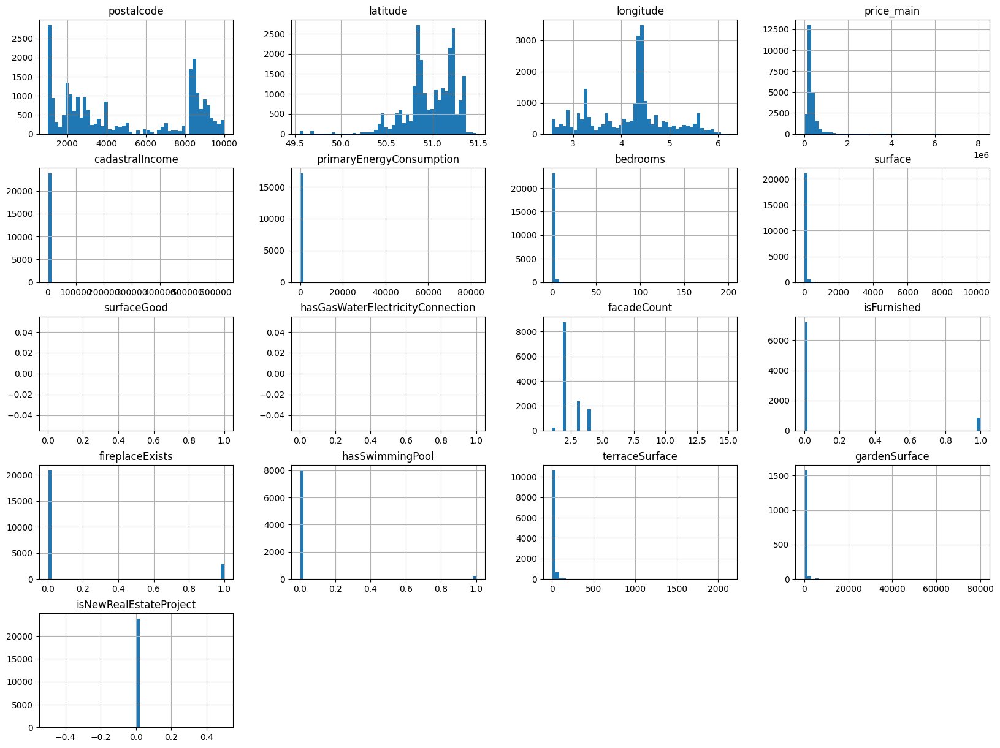

In [20]:
typeofhouses = filtered_house_df.groupby("region")
for region, data in typeofhouses:
    print(region)

filtered_apartment_df.hist(bins=50, figsize=(20,15))
fig = px.scatter(filtered_apartment_df, x='longitude', y='latitude', opacity=0.2, hover_data=['region', 'district'])
fig.show()
# filtered_house_df.hist(bins=50, figsize=(20,15))
# filtered_house_df.plot(kind="scatter", x='longitude', y= 'latitude', alpha =0.2)



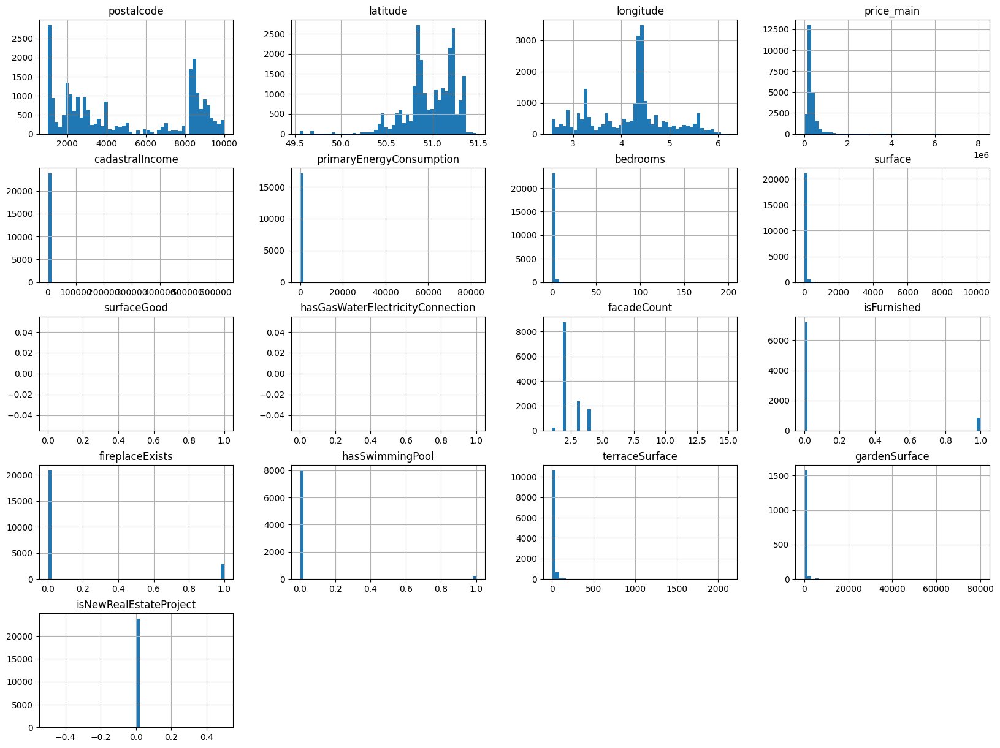

In [21]:
filtered_apartment_df.hist(bins=50, figsize=(20,15))

fig = px.scatter(filtered_house_df, x='longitude', y='latitude', opacity=0.2, hover_data=['region','district'])
fig.show()

In [22]:
# Select only numeric columns for correlation calculation
numeric_apartment_df = filtered_apartment_df.select_dtypes(include='number')

# Calculate correlation coefficients
correlation = numeric_apartment_df.corr()['price_main'].sort_values(ascending=False)
print(correlation)

fig= go.Figure(data= go.Scatter(x=correlation.index, y=correlation.values))

fig.update_layout(title='Correlation Coefficients with price_main',
                  xaxis=dict(title='Variables'),
                  yaxis=dict(title='Correlation Coefficient', range=[-0.2,1])
                 )

fig.show()

price_main                          1.000000
bedrooms                            0.313447
terraceSurface                      0.242820
surface                             0.225926
latitude                            0.212631
hasSwimmingPool                     0.109323
postalcode                          0.086335
facadeCount                         0.049849
cadastralIncome                     0.014800
gardenSurface                       0.010532
isFurnished                        -0.009278
primaryEnergyConsumption           -0.040839
fireplaceExists                    -0.041922
longitude                          -0.156986
surfaceGood                              NaN
hasGasWaterElectricityConnection         NaN
isNewRealEstateProject                   NaN
Name: price_main, dtype: float64


In [23]:

# Calculate price per square meter
filtered_apartment_df['price_per_sqm'] = filtered_apartment_df['price_main'] / df['surface']

# Group by region and locality
grouped = filtered_apartment_df.groupby(['region', 'locality'])

# Compute average and median price per square meter
summary = grouped.agg({'price_per_sqm': ['mean', 'median'], 'price_main': ['mean', 'median']})



In [24]:
# Find least/most expensive municipalities in Flanders
flanders_summary = summary.loc['Flanders']
flanders_least_expensive_sqm = flanders_summary.loc[flanders_summary[('price_per_sqm', 'mean')].idxmin()]
flanders_most_expensive_sqm = flanders_summary.loc[flanders_summary[('price_per_sqm', 'mean')].idxmax()]
flanders_avg = flanders_summary.mean()


print("Least expensive municipalities in Flanders (price per square meter):\n", flanders_least_expensive_sqm)
print("Most expensive municipalities in Flanders (price per square meter):\n", flanders_most_expensive_sqm)
print("Flanders average:\n", flanders_avg)
print()

Least expensive municipalities in Flanders (price per square meter):
 price_per_sqm  mean        300.0
               median      300.0
price_main     mean      15000.0
               median    15000.0
Name: Knocke-Heyst, dtype: float64
Most expensive municipalities in Flanders (price per square meter):
 price_per_sqm  mean      1.607435e+04
               median    1.477552e+04
price_main     mean      1.766222e+06
               median    1.695000e+06
Name: Knokke-Heist Knokke, dtype: float64
Flanders average:
 price_per_sqm  mean        3164.456857
               median      3151.577392
price_main     mean      325001.893033
               median    312551.222103
dtype: float64



In [25]:

# Find least/most expensive municipalities in Wallonia
wallonia_summary = summary.loc['Wallonie']
wallonia_least_expensive_sqm = wallonia_summary.loc[wallonia_summary[('price_per_sqm', 'mean')].idxmin()]
wallonia_most_expensive_sqm = wallonia_summary.loc[wallonia_summary[('price_per_sqm', 'mean')].idxmax()]
wallonia_avg = wallonia_summary.mean()

print("Least expensive municipalities in Wallonia (price per square meter):\n", wallonia_least_expensive_sqm)
print("Most expensive municipalities in Wallonia (price per square meter):\n", wallonia_most_expensive_sqm)
print("Wallonia average:\n", wallonia_avg)

Least expensive municipalities in Wallonia (price per square meter):
 price_per_sqm  mean         159.000000
               median       159.000000
price_main     mean      111633.333333
               median     80000.000000
Name: Courcelles Souvret, dtype: float64
Most expensive municipalities in Wallonia (price per square meter):
 price_per_sqm  mean        7836.902357
               median      7836.902357
price_main     mean      856840.000000
               median    856840.000000
Name: DURBUY, dtype: float64
Wallonia average:
 price_per_sqm  mean        2319.108999
               median      2319.535455
price_main     mean      232551.814855
               median    227394.520259
dtype: float64


In [26]:
filtered_apartment_df['price_per_sqm'] = filtered_apartment_df['price_main'] / filtered_apartment_df['surface']

# Grouping data by region
app_region_groups = filtered_apartment_df.groupby('region')

# Calculate average and median price per square meter for each region
avg_price_per_sqm = app_region_groups['price_per_sqm'].mean()
least_expensive_municipalities = []
most_expensive_municipalities = []
# Identify least and most expensive municipalities
for region, group in app_region_groups:
    least_expensive_municipality = group.loc[group['price_per_sqm'].idxmin()]
    most_expensive_municipality = group.loc[group['price_per_sqm'].idxmax()]
    
    # Append to lists
    least_expensive_municipalities.append((region, least_expensive_municipality['locality'], least_expensive_municipality['price_per_sqm']))
    most_expensive_municipalities.append((region, most_expensive_municipality['locality'], most_expensive_municipality['price_per_sqm']))
    
# Optionally, you can also print the average and median price per square meter for each region
print("Average Price per Square Meter:")
print(avg_price_per_sqm)
# Print least and most expensive municipalities
print("\nLeast Expensive Municipalities:")
print(least_expensive_municipalities)
print("\nMost Expensive Municipalities:")
print(most_expensive_municipalities)

Average Price per Square Meter:
region
Brussels    3733.764160
Flanders    3948.417383
Wallonie    2480.387044
Name: price_per_sqm, dtype: float64

Least Expensive Municipalities:
[('Brussels', 'Anderlecht', 31.500414479137884), ('Flanders', 'Bilzen', 26.041666666666668), ('Wallonie', 'Courcelles Souvret', 159.0)]

Most Expensive Municipalities:
[('Brussels', 'Ixelles', 13448.275862068966), ('Flanders', 'Knokke-Heist', 34507.042253521126), ('Wallonie', 'DURBUY', 10454.545454545454)]


In [27]:
# Convert Series to DataFrame
average_price_df = avg_price_per_sqm.reset_index()
least_expensive_df = pd.DataFrame(least_expensive_municipalities, columns=['region', 'locality', 'price_per_sqm'])
most_expensive_df = pd.DataFrame(most_expensive_municipalities, columns=['region', 'locality', 'price_per_sqm'])


# Create a bar chart for average price per square meter
fig1 = px.bar(data_frame=average_price_df, x='region', y='price_per_sqm',
              title='Average Price per Square Meter for Apartments by Region',
              labels={'price_per_sqm': 'Price per Square Meter', 'region': 'Region'})

# Create a bar chart for least expensive municipalities
fig2 = px.bar(data_frame=least_expensive_df, x='region', y='price_per_sqm',
              title='Least Expensive Municipalities for Apartments by Region',
              labels={'price_per_sqm': 'Price per Square Meter', 'region': 'Region'},
              color='locality')

# Create a bar chart for most expensive municipalities
fig3 = px.bar(data_frame=most_expensive_df, x='region', y='price_per_sqm',
              title='Most Expensive Municipalities for Apartments by Region',
              labels={'price_per_sqm': 'Price per Square Meter', 'region': 'Region'},
              color='locality')

# Show charts
fig1.show()
fig2.show()
fig3.show()

In [28]:
# Group by municipality and calculate the average, median, and price per square meter
grouped = filtered_apartment_df.groupby('locality').agg({
    'price_main': ['mean', 'median'],
    'price_per_sqm': 'mean'
})

# Sort the grouped dataframe by price per square meter, average price, and median price
sorted_by_price_per_sqm = grouped.sort_values(('price_per_sqm', 'mean'))
sorted_by_avg_price = grouped.sort_values(('price_main', 'mean'))
sorted_by_median_price = grouped.sort_values(('price_main', 'median'))

# Display the top and bottom entries for each sorting method
least_expensive_price_per_sqm = sorted_by_price_per_sqm.head(1)
most_expensive_price_per_sqm = sorted_by_price_per_sqm.tail(1)

least_expensive_avg_price = sorted_by_avg_price.head(1)
most_expensive_avg_price = sorted_by_avg_price.tail(1)

least_expensive_median_price = sorted_by_median_price.head(1)
most_expensive_median_price = sorted_by_median_price.tail(1)

# Print or display the results
print("Least Expensive Municipalities by Price Per Square Meter:")
print(least_expensive_price_per_sqm)
print("\nMost Expensive Municipalities by Price Per Square Meter:")
print(most_expensive_price_per_sqm)

print("\nLeast Expensive Municipalities by Average Price:")
print(least_expensive_avg_price)
print("\nMost Expensive Municipalities by Average Price:")
print(most_expensive_avg_price)

print("\nLeast Expensive Municipalities by Median Price:")
print(least_expensive_median_price)
print("\nMost Expensive Municipalities by Median Price:")
print(most_expensive_median_price)

Least Expensive Municipalities by Price Per Square Meter:
                       price_main          price_per_sqm
                             mean   median          mean
locality                                                
Courcelles Souvret  111633.333333  80000.0         159.0

Most Expensive Municipalities by Price Per Square Meter:
         price_main           price_per_sqm
               mean    median          mean
locality                                   
evere      215000.0  215000.0           NaN

Least Expensive Municipalities by Average Price:
             price_main          price_per_sqm
                   mean   median          mean
locality                                      
Knocke-Heyst    15000.0  15000.0         300.0

Most Expensive Municipalities by Average Price:
                       price_main            price_per_sqm
                             mean     median          mean
locality                                                  
Knokke-Heist Kno

In [29]:
# # Group by municipality and calculate the average, median, and price per square meter
# grouped = filtered_house_df.groupby('locality').agg({
#     'price_main': ['mean', 'median'],
#     'price_per_sqm': 'mean'
# })

# # Sort the grouped dataframe by price per square meter, average price, and median price
# sorted_by_price_per_sqm = grouped.sort_values(('price_per_sqm', 'mean'))
# sorted_by_avg_price = grouped.sort_values(('price_main', 'mean'))
# sorted_by_median_price = grouped.sort_values(('price_main', 'median'))

# # Display the top and bottom entries for each sorting method
# least_expensive_price_per_sqm = sorted_by_price_per_sqm.head(1)
# most_expensive_price_per_sqm = sorted_by_price_per_sqm.tail(1)

# least_expensive_avg_price = sorted_by_avg_price.head(1)
# most_expensive_avg_price = sorted_by_avg_price.tail(1)

# least_expensive_median_price = sorted_by_median_price.head(1)
# most_expensive_median_price = sorted_by_median_price.tail(1)

# # Print or display the results
# print("Least Expensive Municipalities by Price Per Square Meter:")
# print(least_expensive_price_per_sqm)
# print("\nMost Expensive Municipalities by Price Per Square Meter:")
# print(most_expensive_price_per_sqm)

# print("\nLeast Expensive Municipalities by Average Price:")
# print(least_expensive_avg_price)
# print("\nMost Expensive Municipalities by Average Price:")
# print(most_expensive_avg_price)

# print("\nLeast Expensive Municipalities by Median Price:")
# print(least_expensive_median_price)
# print("\nMost Expensive Municipalities by Median Price:")
# print(most_expensive_median_price)

# 10 most and least expensive areas in each region for apartements

In [30]:
# Calculate average surface and price_main per district
avg_df = filtered_apartment_df.groupby('locality').agg(avg_surface=('surface', 'mean'),
                                    avg_price_main=('price_main', 'mean')).reset_index()

# Calculate average price_per_sqm
avg_df['avg_price_per_sqm'] = avg_df['avg_price_main'] / avg_df['avg_surface']

# Round the values to 2 decimal places
avg_df['avg_surface'] = avg_df['avg_surface'].round(2)
avg_df['avg_price_main'] = avg_df['avg_price_main'].round(2)
avg_df['avg_price_per_sqm'] = avg_df['avg_price_per_sqm'].round(2)

# Add region to the DataFrame
avg_df['region'] = filtered_apartment_df.groupby('locality')['region'].first().values

# Reorder columns
avg_df = avg_df[['region', 'locality', 'avg_surface', 'avg_price_main', 'avg_price_per_sqm']]

# Sorting the DataFrame by region and avg_price_per_sqm
sorted_df = avg_df.sort_values(by=['region', 'avg_price_per_sqm'], ascending=[True, False])

# Top 10 localities with the most expensive avg_price_per_sqm per region
top_expensive_per_region = sorted_df.groupby('region').head(30)

# Sorting the DataFrame by region and avg_price_per_sqm in ascending order
sorted_df_asc = avg_df.sort_values(by=['region', 'avg_price_per_sqm'], ascending=[True, True])

# Top 10 localities with the least expensive avg_price_per_sqm per region
top_cheap_per_region = sorted_df_asc.groupby('region').head(30)

print("Top 10 localities with most expensive avg_price_per_sqm per region:")
print(top_expensive_per_region)
print("\nTop 10 localities with least expensive avg_price_per_sqm per region:")
print(top_cheap_per_region)
print(avg_df)

Top 10 localities with most expensive avg_price_per_sqm per region:
        region                                     locality  avg_surface  \
263   Brussels                    Bruxelles-Quartier Louise       170.00   
1459  Brussels                                        Ukkel       103.25   
1254  Brussels                          SINT-AGATHA-BERCHEM        72.00   
1590  Brussels    Woluwe-Saint-Pierre - Sint-Pieters-Woluwe        70.00   
1391  Brussels                            St-Pieters-Woluwe        97.50   
...        ...                                          ...          ...   
1125  Wallonie                   Ottignies-Louvain-la-Neuve        79.87   
1126  Wallonie  Ottignies-Louvain-la-Neuve Louvain-la-Neuve       154.33   
1471  Wallonie                                         VISÉ       122.80   
656   Wallonie                                       Herve        110.00   
99    Wallonie                                Arlon Heinsch        84.00   

      avg_price_mai

In [31]:
# Create the line plot for most expensive
fig_most_expensive = go.Figure()

region_colors = {'Brussels': 'blue', 'Flanders': 'green', 'Wallonie': 'red'}

# Add traces for most expensive per region
for region, region_data in top_expensive_per_region.groupby('region'):
    first_trace = True
    for locality, locality_data in region_data.groupby('locality'):
        fig_most_expensive.add_trace(go.Scatter(x=locality_data['avg_surface'], y=locality_data['avg_price_per_sqm'],
                                                mode='lines+markers',
                                                name=f"{region}" if first_trace else None,
                                                hovertext=f"Region: {region}<br>Locality: {locality}<br>"
                                                          f"Avg Surface: {locality_data['avg_surface'].values[0]}<br>"
                                                          f"Avg Price: {locality_data['avg_price_main'].values[0]}<br>"
                                                          f"Avg Price per sqm: {locality_data['avg_price_per_sqm'].values[0]}",
                                                line=dict(color=region_colors[region]),
                                                showlegend=first_trace))
        first_trace = False

# Update layout for most expensive
fig_most_expensive.update_layout(title='Most Expensive Average Price of Apartments per Square Meter per Region',
                                 xaxis_title='Average Surface',
                                 yaxis_title='Average Price per Square Meter',
                                 hovermode='closest')

fig_most_expensive.show()

# Create the line plot for least expensive
fig_least_expensive = go.Figure()

# Add traces for least expensive per region
for region, region_data in top_cheap_per_region.groupby('region'):
    first_trace = True
    for locality, locality_data in region_data.groupby('locality'):
        fig_least_expensive.add_trace(go.Scatter(x=locality_data['avg_surface'], y=locality_data['avg_price_per_sqm'],
                                                 mode='lines+markers',
                                                 name=f"{region}" if first_trace else None,
                                                 hovertext=f"Region: {region}<br>Locality: {locality}<br>"
                                                           f"Avg Surface: {locality_data['avg_surface'].values[0]}<br>"
                                                           f"Avg Price: {locality_data['avg_price_main'].values[0]}<br>"
                                                           f"Avg Price per sqm: {locality_data['avg_price_per_sqm'].values[0]}",
                                                 line=dict(color=region_colors[region]),
                                                 showlegend=first_trace))
        first_trace = False

# Update layout for least expensive
fig_least_expensive.update_layout(title='Least Expensive Average Price of Apartments per Square Meter per Region',
                                  xaxis_title='Average Surface',
                                  yaxis_title='Average Price per Square Meter',
                                  hovermode='closest')

fig_least_expensive.show()

In [32]:
# Assuming 'district' is the column containing district names
district_counts = filtered_apartment_df['district'].value_counts()

top_sorted_count = district_counts.sort_values(ascending=False).head(30)
bot_sorted_count = district_counts.sort_values(ascending=False).tail(30)

# Display the count of properties in each district
print(top_sorted_count)
print(bot_sorted_count)

district
Antwerp            3639
Brussels           3600
Brugge             2024
Oostend            1417
Gent               1183
Liège              1011
Leuven              865
Halle-Vilvoorde     862
Turnhout            836
Veurne              811
Mechelen            783
Kortrijk            703
Hasselt             607
Aalst               565
Sint-Niklaas        471
Nivelles            418
Namur               345
Roeselare           337
Dendermonde         314
Charleroi           312
Verviers            289
Oudenaarde          258
Maaseik             239
Mons                217
Tongeren            179
Eeklo               172
Soignies            152
Tielt               146
Ieper               126
Huy                 106
Name: count, dtype: int64
district
Aalst                565
Sint-Niklaas         471
Nivelles             418
Namur                345
Roeselare            337
Dendermonde          314
Charleroi            312
Verviers             289
Oudenaarde           258
Maaseik    

In [33]:
# Initialize empty dictionaries to store correlations for top and bottom districts
top_correlation_per_district = {}
bottom_correlation_per_district = {}

# Iterate over each district
for district, group_data in filtered_apartment_df.groupby('district'):
    # Calculate correlation coefficient
    correlation_coefficient = group_data[['price_main']].corrwith(group_data['surface'])[0]
    
    # Store correlation coefficient for the current district in the appropriate dictionary
    if district in top_sorted_count.index:
        top_correlation_per_district[district] = correlation_coefficient.round(2)
    elif district in bot_sorted_count.index:
        bottom_correlation_per_district[district] = correlation_coefficient.round(2)

# Convert dictionaries to DataFrames
top_correlation_df = pd.DataFrame.from_dict(top_correlation_per_district, orient='index', columns=['correlation'])
bottom_correlation_df = pd.DataFrame.from_dict(bottom_correlation_per_district, orient='index', columns=['correlation'])

# Reorder correlation DataFrames based on district_counts
top_correlation_df = top_correlation_df.reindex(top_sorted_count.index)
bottom_correlation_df = bottom_correlation_df.reindex(bot_sorted_count.index)

# Display correlations for top and bottom districts
print("\nCorrelation for top districts:")
print(top_correlation_df)
print("\nCorrelation for bottom districts:")
print(bottom_correlation_df)


Correlation for top districts:
                 correlation
district                    
Antwerp                 0.20
Brussels                0.29
Brugge                  0.52
Oostend                 0.71
Gent                    0.72
Liège                   0.58
Leuven                  0.71
Halle-Vilvoorde         0.71
Turnhout                0.67
Veurne                  0.61
Mechelen                0.11
Kortrijk                0.40
Hasselt                 0.64
Aalst                   0.68
Sint-Niklaas            0.88
Nivelles                0.75
Namur                   0.52
Roeselare               0.74
Dendermonde             0.82
Charleroi               0.44
Verviers                0.77
Oudenaarde              0.69
Maaseik                 0.80
Mons                    0.59
Tongeren                0.74
Eeklo                   0.53
Soignies                0.46
Tielt                   0.40
Ieper                   0.48
Huy                     0.68

Correlation for bottom districts:
     

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\3215526814.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\3215526814.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\3215526814.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\3215526814.py:8: FutureWarning:

Series.__getit

In [34]:
# Merge district counts with correlation DataFrames for plotting
top_correlation_df = top_correlation_df.merge(top_sorted_count, left_index=True, right_index=True)
bottom_correlation_df = bottom_correlation_df.merge(bot_sorted_count, left_index=True, right_index=True)

# Plot correlations for top 10 districts
fig_top = px.bar(top_correlation_df, x=top_correlation_df.index, y='correlation', 
                  title='Correlation between price and amount of Apartments on sale for top 10 districts',
                  labels={'x': 'District', 'correlation': 'Correlation Coefficient'})
fig_top.update_layout(xaxis={'categoryorder':'array', 'categoryarray': top_correlation_df.index})
fig_top.update_yaxes(range=[0, 1])  # Set y-axis range from 0 to 1

# Plot correlations for bottom 10 districts
fig_bottom = px.bar(bottom_correlation_df, x=bottom_correlation_df.index, y='correlation', 
                     title='Correlation between price and amount of Apartments on sale for bottom 10 districts',
                     labels={'x': 'District', 'correlation': 'Correlation Coefficient'})
fig_bottom.update_layout(xaxis={'categoryorder':'array', 'categoryarray': bottom_correlation_df.index})
fig_bottom.update_yaxes(range=[0, 1])  # Set y-axis range from 0 to 1

# Display plots
fig_top.show()
fig_bottom.show()

In [35]:
correlation_epc_condition_df = filtered_apartment_df.groupby(['epcScores', 'condition']).size().reset_index(name='count')

print("Correlation between EPC score and condition:")
print(correlation_epc_condition_df)

fig = px.scatter(correlation_epc_condition_df, x='condition', y='epcScores', size='count',
                 title='Correlation between EPC Scores and Condition for',
                 labels={'condition': 'Condition', 'epcScores': 'EPC Scores', 'count': 'Count'},
                 color='count', hover_name='count')

fig_top.update_layout(xaxis={'categoryorder':'array', 'categoryarray': top_correlation_df.index})
fig_top.update_yaxes(range=[0, 1])  # Set y-axis range from 0 to 1
fig.show()

Correlation between EPC score and condition:
   epcScores       condition  count
0          A          AS_NEW    993
1          A            GOOD    856
2          A  JUST_RENOVATED     70
3          A   TO_BE_DONE_UP     17
4          A     TO_RENOVATE      5
5         A+          AS_NEW     47
6         A+            GOOD     36
7         A+  JUST_RENOVATED      1
8        A++          AS_NEW     36
9        A++            GOOD    135
10       A++  JUST_RENOVATED      1
11       A++   TO_BE_DONE_UP      3
12       A++     TO_RENOVATE      1
13      A_A+          AS_NEW      3
14         B          AS_NEW   1455
15         B            GOOD   2250
16         B  JUST_RENOVATED    363
17         B   TO_BE_DONE_UP    218
18         B     TO_RENOVATE     82
19         B      TO_RESTORE      5
20         C          AS_NEW    564
21         C            GOOD   1461
22         C  JUST_RENOVATED    246
23         C   TO_BE_DONE_UP    302
24         C     TO_RENOVATE     93
25         C      T

In [46]:
# Group the DataFrame by 'price' and 'epcScores' and calculate the count
correlation_price_epc_df = filtered_apartment_df.groupby(['price_main', 'epcScores']).size().reset_index(name='count')

# Pivot the dataframe to prepare for heatmap
heatmap_data = correlation_price_epc_df.pivot(index='epcScores', columns='price_main', values='count')

# Create the heatmap
fig = px.imshow(heatmap_data, 
                labels=dict(x="Price", y="EPC Scores", color="Count"),
                x=heatmap_data.columns,
                y=heatmap_data.index,
                title='Correlation between Price and EPC Scores for Apartments',
                color_continuous_scale='Viridis')  # Optional: Set the color scale

# Add annotations to each square in the heatmap
annotations = []
for i, row in enumerate(heatmap_data.values):
    for j, value in enumerate(row):
        annotations.append(dict(text=str(value),
                                x=heatmap_data.columns[j],
                                y=heatmap_data.index[i],
                                showarrow=False))
fig.update_layout(annotations=annotations)

# Show the heatmap
fig.show()

In [37]:
correlation_epc_condition_df = filtered_house_df.groupby(['epcScores', 'condition']).size().reset_index(name='count')
heatmap_data = correlation_epc_condition_df.pivot(index='condition', columns='epcScores', values='count')

# Create the heatmap
fig = px.imshow(heatmap_data, 
                labels=dict(x="EPC Scores", y="Condition", color="Count"),
                x=heatmap_data.columns,
                y=heatmap_data.index,
                title='Correlation between EPC Scores and Condition for Houses',
                color_continuous_scale='Viridis')  # Optional: Set the color scale

# Add annotations to each square in the heatmap
annotations = []
for i, row in enumerate(heatmap_data.values):
    for j, value in enumerate(row):
        annotations.append(dict(text=str(value),
                                x=heatmap_data.columns[j],
                                y=heatmap_data.index[i],
                                showarrow=False))
fig.update_layout(annotations=annotations)

# Show the heatmap
fig.show()

In [47]:
correlation_epc_price_df = filtered_house_df.groupby('epcScores')['price_main'].mean().reset_index()
# Print the first few rows to inspect the data
print(correlation_epc_price_df.head())



  epcScores     price_main
0         A  559246.778123
1        A+  519968.398907
2       A++  696304.045977
3    A+_A++  418333.333333
4      A_A+  337140.000000


In [39]:
filtered_house_df['price_per_sqm'] = filtered_house_df['price_main'] / filtered_house_df['surface']

# Grouping data by region
house_region_groups = filtered_house_df.groupby('region')

# Calculate average and median price per square meter for each region
average_price_per_sqm = house_region_groups['price_per_sqm'].mean()
least_expensive_municipalities = []
most_expensive_municipalities = []
# Identify least and most expensive municipalities
for region, group in house_region_groups:
    least_expensive_municipality = group.loc[group['price_per_sqm'].idxmin()]
    most_expensive_municipality = group.loc[group['price_per_sqm'].idxmax()]
    
    # Append to lists
    least_expensive_municipalities.append((region, least_expensive_municipality['locality'], least_expensive_municipality['price_per_sqm']))
    most_expensive_municipalities.append((region, most_expensive_municipality['locality'], most_expensive_municipality['price_per_sqm']))
    
# Optionally, you can also print the average and median price per square meter for each region
print("Average Price per Square Meter:")
print(average_price_per_sqm)
# Print least and most expensive municipalities
print("\nLeast Expensive Municipalities:")
print(least_expensive_municipalities)
print("\nMost Expensive Municipalities:")
print(most_expensive_municipalities)

Average Price per Square Meter:
region
Brussels    2914.711579
Flanders    2330.546119
Wallonie    1692.118144
Name: price_per_sqm, dtype: float64

Least Expensive Municipalities:
[('Brussels', 'Anderlecht', 588.2352941176471), ('Flanders', 'Ursel', 69.18650274653413), ('Wallonie', 'Robertville', 3.6603221083455346)]

Most Expensive Municipalities:
[('Brussels', 'Jette', 22631.57894736842), ('Flanders', 'Knokke-Heist', 30629.92125984252), ('Wallonie', 'Seraing', 15942.028985507246)]


In [40]:
# Convert Series to DataFrame
average_price_df = average_price_per_sqm.reset_index()
least_expensive_df = pd.DataFrame(least_expensive_municipalities, columns=['region', 'locality', 'price_per_sqm'])
most_expensive_df = pd.DataFrame(most_expensive_municipalities, columns=['region', 'locality', 'price_per_sqm'])


# Create a bar chart for average price per square meter
fig1 = px.bar(data_frame=average_price_df, x='region', y='price_per_sqm',
              title='Average Price per Square Meter for Houses by Region',
              labels={'price_per_sqm': 'Price per Square Meter', 'region': 'Region'})

# Create a bar chart for least expensive municipalities
fig2 = px.bar(data_frame=least_expensive_df, x='region', y='price_per_sqm',
              title='Least Expensive Municipalities for Houses by Region',
              labels={'price_per_sqm': 'Price per Square Meter', 'region': 'Region'},
              color='locality')

# Create a bar chart for most expensive municipalities
fig3 = px.bar(data_frame=most_expensive_df, x='region', y='price_per_sqm',
              title='Most Expensive Municipalities for Houses by Region',
              labels={'price_per_sqm': 'Price per Square Meter', 'region': 'Region'},
              color='locality')

# Show charts
fig1.show()
fig2.show()
fig3.show()

In [41]:
# Calculate average surface and price_main per district
avg_df = filtered_house_df.groupby('locality').agg(avg_surface=('surface', 'mean'),
                                    avg_price_main=('price_main', 'mean')).reset_index()

# Calculate average price_per_sqm
avg_df['avg_price_per_sqm'] = avg_df['avg_price_main'] / avg_df['avg_surface']

# Round the values to 2 decimal places
avg_df['avg_surface'] = avg_df['avg_surface'].round(2)
avg_df['avg_price_main'] = avg_df['avg_price_main'].round(2)
avg_df['avg_price_per_sqm'] = avg_df['avg_price_per_sqm'].round(2)

# Add region to the DataFrame
avg_df['region'] = filtered_house_df.groupby('locality')['region'].first().values

# Reorder columns
avg_df = avg_df[['region', 'locality', 'avg_surface', 'avg_price_main', 'avg_price_per_sqm']]

# Sorting the DataFrame by region and avg_price_per_sqm
sorted_df = avg_df.sort_values(by=['region', 'avg_price_per_sqm'], ascending=[True, False])

# Top 10 localities with the most expensive avg_price_per_sqm per region
top_expensive_per_region = sorted_df.groupby('region').head(10)

# Sorting the DataFrame by region and avg_price_per_sqm in ascending order
sorted_df_asc = avg_df.sort_values(by=['region', 'avg_price_per_sqm'], ascending=[True, True])

# Top 10 localities with the least expensive avg_price_per_sqm per region
top_cheap_per_region = sorted_df_asc.groupby('region').head(10)

print("Top 10 localities with most expensive avg_price_per_sqm per region:")
print(top_expensive_per_region)
print("\nTop 10 localities with least expensive avg_price_per_sqm per region:")
print(top_cheap_per_region)
print(avg_df)

Top 10 localities with most expensive avg_price_per_sqm per region:
        region                                   locality  avg_surface  \
3602  Brussels                         Ville de Bruxelles       230.20   
3680  Brussels                        WATERMAEL-BOITSFORT       255.00   
3715  Brussels                       WOLUWE-SAINT-LAMBERT       329.50   
3252  Brussels                        Sint-Pieters-Woluwe       275.67   
3763  Brussels                        Watermael-Boitsfort       201.64   
3502  Brussels                                      Uccle       281.11   
3848  Brussels  Woluwe-Saint-Pierre - Sint-Pieters-Woluwe       405.00   
3849  Brussels                          Woluwe-St-Lambert       330.00   
963   Brussels                                     Elsene       474.33   
3850  Brussels                           Woluwe-St-Pierre       245.00   
1558  Flanders                                  Het Zoute       355.00   
3960  Flanders                              

In [42]:
# Create the line plot for most expensive
fig_most_expensive = go.Figure()

region_colors = {'Brussels': 'blue', 'Flanders': 'green', 'Wallonie': 'red'}

# Add traces for most expensive per region
for region, region_data in top_expensive_per_region.groupby('region'):
    first_trace = True
    for locality, locality_data in region_data.groupby('locality'):
        fig_most_expensive.add_trace(go.Scatter(x=locality_data['avg_surface'], y=locality_data['avg_price_per_sqm'],
                                                mode='lines+markers',
                                                name=f"{region}" if first_trace else None,
                                                hovertext=f"Region: {region}<br>Locality: {locality}<br>"
                                                          f"Avg Surface: {locality_data['avg_surface'].values[0]}<br>"
                                                          f"Avg Price: {locality_data['avg_price_main'].values[0]}<br>"
                                                          f"Avg Price per sqm: {locality_data['avg_price_per_sqm'].values[0]}",
                                                line=dict(color=region_colors[region]),
                                                showlegend=first_trace))
        first_trace = False

# Update layout for most expensive
fig_most_expensive.update_layout(title='Most Expensive Average Price for Houses per Square Meter per Region',
                                 xaxis_title='Average Surface',
                                 yaxis_title='Average Price per Square Meter',
                                 hovermode='closest')

fig_most_expensive.show()

# Create the line plot for least expensive
fig_least_expensive = go.Figure()

# Add traces for least expensive per region
for region, region_data in top_cheap_per_region.groupby('region'):
    first_trace = True
    for locality, locality_data in region_data.groupby('locality'):
        fig_least_expensive.add_trace(go.Scatter(x=locality_data['avg_surface'], y=locality_data['avg_price_per_sqm'],
                                                 mode='lines+markers',
                                                 name=f"{region}" if first_trace else None,
                                                 hovertext=f"Region: {region}<br>Locality: {locality}<br>"
                                                           f"Avg Surface: {locality_data['avg_surface'].values[0]}<br>"
                                                           f"Avg Price: {locality_data['avg_price_main'].values[0]}<br>"
                                                           f"Avg Price per sqm: {locality_data['avg_price_per_sqm'].values[0]}",
                                                 line=dict(color=region_colors[region]),
                                                 showlegend=first_trace))
        first_trace = False

# Update layout for least expensive
fig_least_expensive.update_layout(title='Least Expensive Average Price for Houses per Square Meter per Region',
                                  xaxis_title='Average Surface',
                                  yaxis_title='Average Price per Square Meter',
                                  hovermode='closest')

fig_least_expensive.show()

In [43]:
# Assuming 'district' is the column containing district names
district_counts = filtered_house_df['district'].value_counts()

top_sorted_count = district_counts.sort_values(ascending=False).head(30)
bot_sorted_count = district_counts.sort_values(ascending=False).tail(30)

# Display the count of properties in each district
print(top_sorted_count)
print(bot_sorted_count)

district
Antwerp            3064
Liège              2569
Gent               1961
Halle-Vilvoorde    1879
Leuven             1773
Turnhout           1753
Aalst              1458
Brugge             1354
Kortrijk           1342
Brussels           1276
Mechelen           1220
Charleroi          1191
Hasselt            1117
Sint-Niklaas        824
Dendermonde         819
Nivelles            814
Verviers            805
Oudenaarde          737
Roeselare           690
Mons                682
Namur               643
Oostend             609
Soignies            530
Huy                 456
Tongeren            429
Thuin               425
Tielt               416
Dinant              411
Eeklo               388
Maaseik             372
Name: count, dtype: int64
district
Sint-Niklaas         824
Dendermonde          819
Nivelles             814
Verviers             805
Oudenaarde           737
Roeselare            690
Mons                 682
Namur                643
Oostend              609
Soignies   

In [44]:
# Assuming 'district' is the column containing district names
district_counts = filtered_house_df['district'].value_counts()

top_sorted_count = district_counts.sort_values(ascending=False).head(20)
bot_sorted_count = district_counts.sort_values(ascending=False).tail(20)

# Initialize empty dictionaries to store correlations for top and bottom districts
top_correlation_per_district = {}
bottom_correlation_per_district = {}

# Iterate over each district
for district, group_data in filtered_house_df.groupby('district'):
    # Calculate correlation coefficient
    correlation_coefficient = group_data[['price_main']].corrwith(group_data['surface'])[0]
    
    # Store correlation coefficient for the current district in the appropriate dictionary
    if district in top_sorted_count.index:
        top_correlation_per_district[district] = correlation_coefficient.round(2)
    elif district in bot_sorted_count.index:
        bottom_correlation_per_district[district] = correlation_coefficient.round(2)

# Convert dictionaries to DataFrames
top_correlation_df = pd.DataFrame.from_dict(top_correlation_per_district, orient='index', columns=['correlation'])
bottom_correlation_df = pd.DataFrame.from_dict(bottom_correlation_per_district, orient='index', columns=['correlation'])

# Reorder correlation DataFrames based on district_counts
top_correlation_df = top_correlation_df.reindex(top_sorted_count.index)
bottom_correlation_df = bottom_correlation_df.reindex(bot_sorted_count.index)

# Display correlations for top and bottom districts
print("\nCorrelation for top districts:")
print(top_correlation_df)
print("\nCorrelation for bottom districts:")
print(bottom_correlation_df)


Correlation for top districts:
                 correlation
district                    
Antwerp                 0.73
Liège                   0.56
Gent                    0.34
Halle-Vilvoorde         0.69
Leuven                  0.56
Turnhout                0.72
Aalst                   0.66
Brugge                  0.44
Kortrijk                0.66
Brussels                0.71
Mechelen                0.68
Charleroi               0.80
Hasselt                 0.61
Sint-Niklaas            0.67
Dendermonde             0.67
Nivelles                0.57
Verviers                0.64
Oudenaarde              0.44
Roeselare               0.59
Mons                    0.78

Correlation for bottom districts:
                   correlation
district                      
Huy                       0.75
Tongeren                  0.70
Thuin                     0.64
Tielt                     0.55
Dinant                    0.42
Eeklo                     0.77
Maaseik                   0.70
Ath             

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\316652768.py:14: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\316652768.py:14: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\316652768.py:14: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\arian\AppData\Local\Temp\ipykernel_17272\316652768.py:14: FutureWarning:

Series.__getit

In [45]:
# Merge district counts with correlation DataFrames for plotting
top_correlation_df = top_correlation_df.merge(top_sorted_count, left_index=True, right_index=True)
bottom_correlation_df = bottom_correlation_df.merge(bot_sorted_count, left_index=True, right_index=True)

# Plot correlations for top 10 districts
fig_top = px.bar(top_correlation_df, x=top_correlation_df.index, y='correlation', 
                  title='Correlation between price and amount of Houses on sale for top 30 districts',
                  labels={'x': 'District', 'correlation': 'Correlation Coefficient'})
fig_top.update_layout(xaxis={'categoryorder':'array', 'categoryarray': top_correlation_df.index})
fig_top.update_yaxes(range=[0, 1])  # Set y-axis range from 0 to 1

# Plot correlations for bottom 10 districts
fig_bottom = px.bar(bottom_correlation_df, x=bottom_correlation_df.index, y='correlation', 
                     title='Correlation between price and amount of Houses on sale for bottom 30 districts',
                     labels={'x': 'District', 'correlation': 'Correlation Coefficient'})
fig_bottom.update_layout(xaxis={'categoryorder':'array', 'categoryarray': bottom_correlation_df.index})
fig_bottom.update_yaxes(range=[0, 1])  # Set y-axis range from 0 to 1

# Display plots
fig_top.show()
fig_bottom.show()

code